In [25]:
import numpy as np
from skimage.transform import resize
import rasterio

def preprocess(image_path, target_size=(256, 256)):
    # Load image
    with rasterio.open(image_path) as src:
        image = src.read()  # Read all bands
        image = np.transpose(image, (1, 2, 0))  # Reorder dimensions to (height, width, channels)

        # Remove alpha channel if present
        if image.shape[2] == 4:  # RGBA -> RGB
            image = image[..., :3]

    # Resize image
    image = resize(image, target_size + (image.shape[2],), anti_aliasing=True)

    # Normalize image
    image_min = image.min()
    image_max = image.max()
    image = (image - image_min) / (image_max - image_min + 1e-8)  # Avoid division by zero

    return image

# Get test image paths
test_image_paths = get_image_mask_paths(TEST_DIR)[0]

# Preprocess test images
X_test = np.array([preprocess(path, target_size=(256, 256)) for path in test_image_paths])

from sklearn.metrics import jaccard_score

y_true = Y_test.flatten()
y_pred = (predictions > 0.5).astype(np.uint8).flatten()

iou = jaccard_score(y_true, y_pred, average='micro')
print(f"Mean IoU: {iou}")

# Predict building footprints
predictions = model.predict(X_test)

# Ensure predictions are binary masks
predicted_masks = (predictions > 0.5).astype(np.float32)

Mean IoU: 0.840002133791537
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


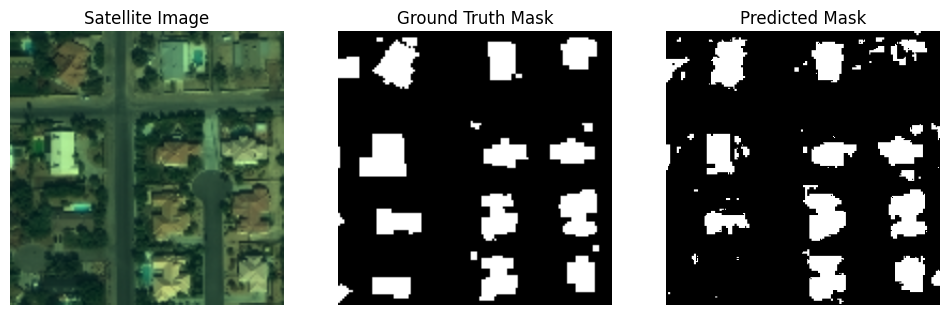

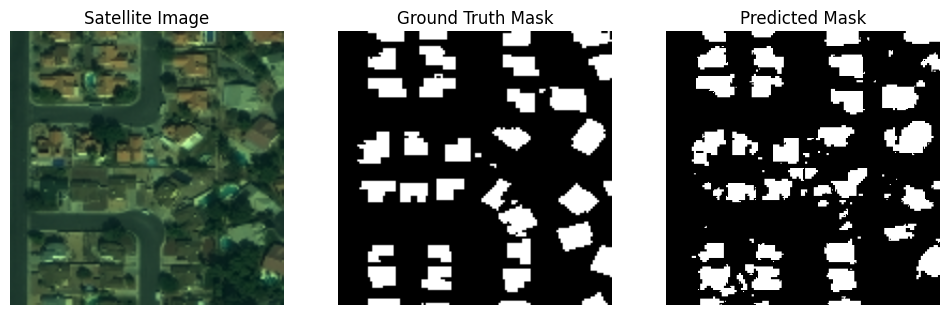

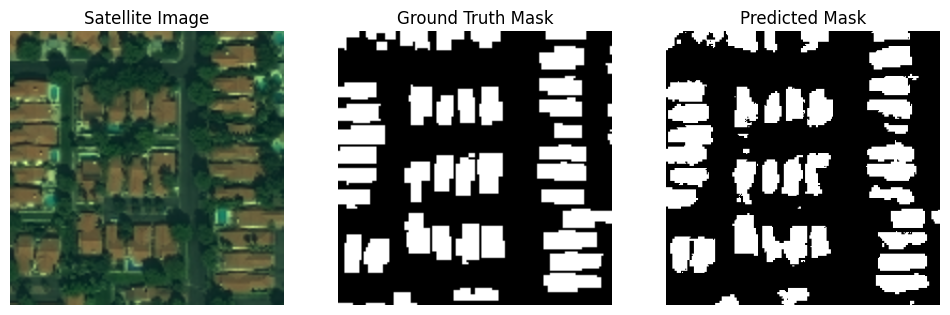

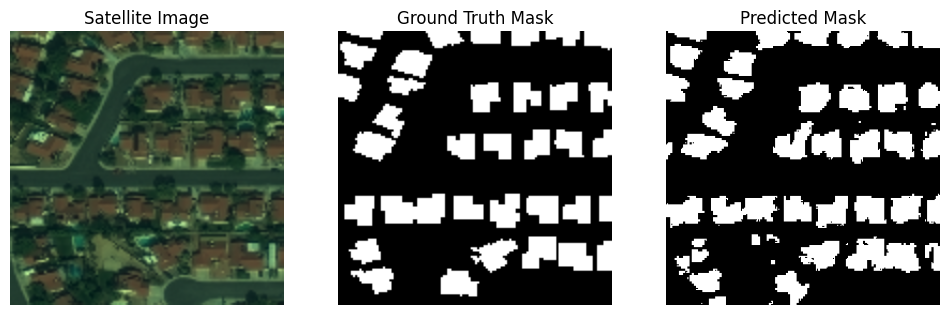

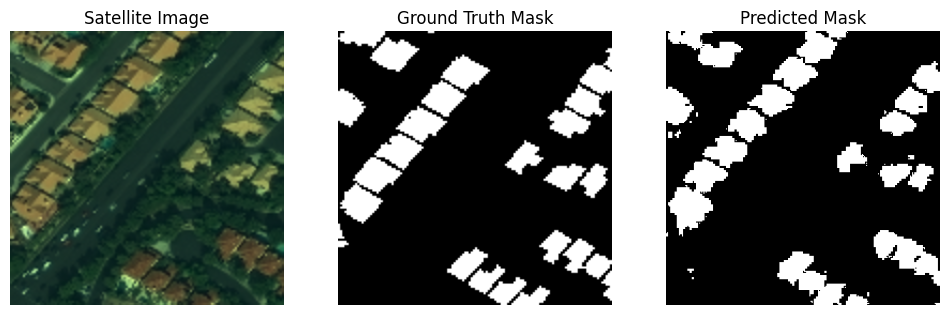

...

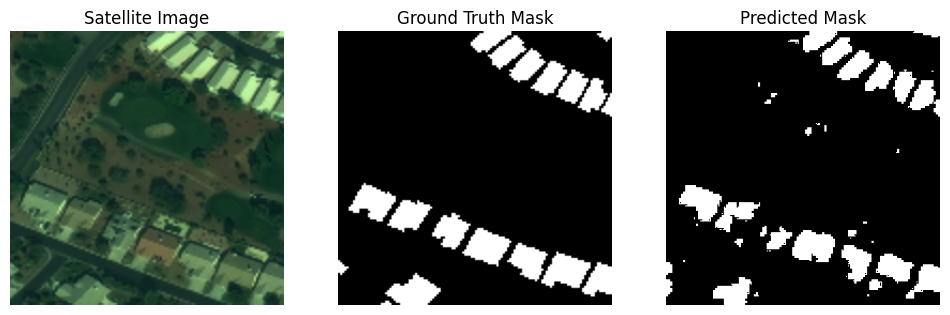

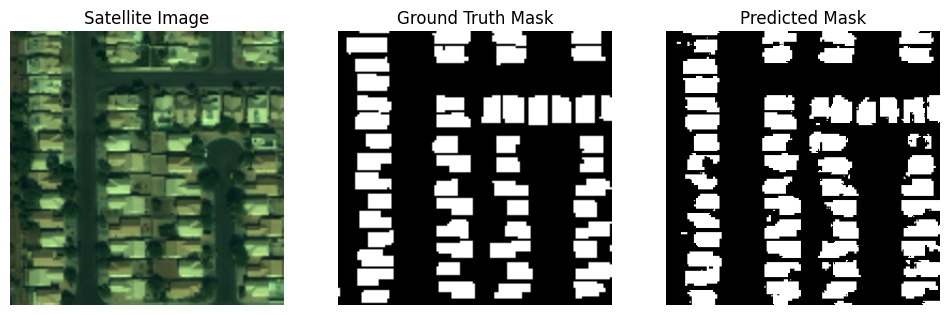

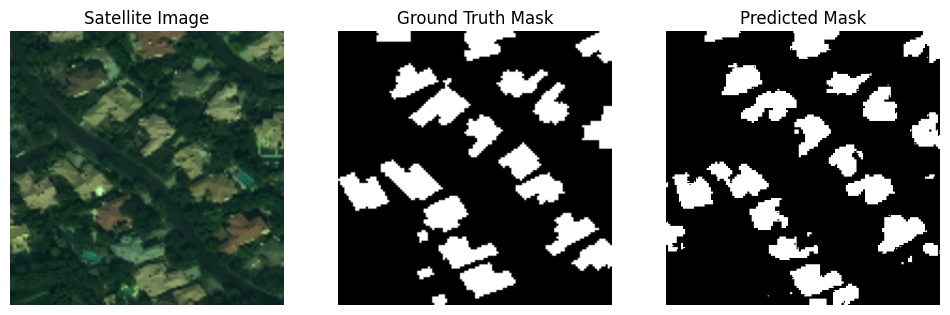

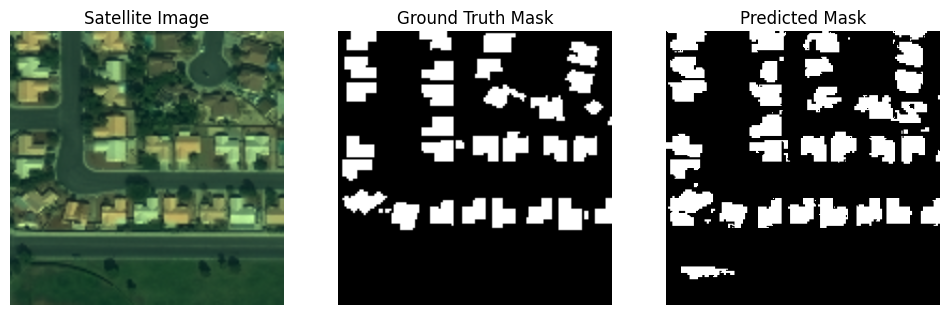

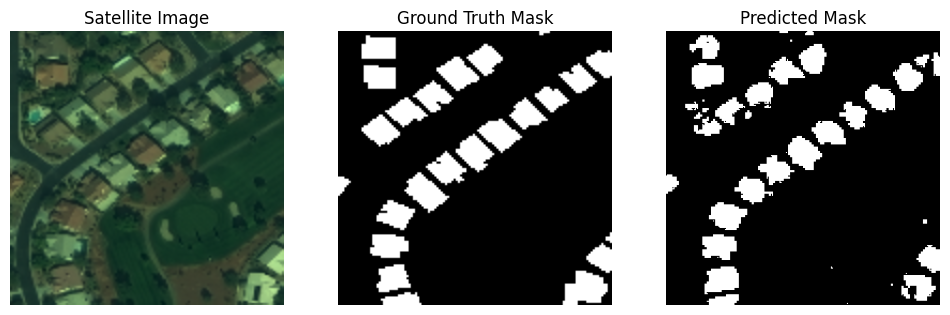

In [26]:
import matplotlib.pyplot as plt

# Display predictions
for i in range(len(X_test)):
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 3, 1)
    plt.title("Satellite Image")
    plt.imshow(X_test[i])
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.title("Ground Truth Mask")
    plt.imshow(rasterio.open(test_mask_paths[i]).read(1), cmap='gray')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.title("Predicted Mask")
    plt.imshow(predicted_masks[i, :, :, 0], cmap='gray')
    plt.axis('off')

    plt.show()

In [27]:
from sklearn.metrics import jaccard_score

# Flatten the masks
y_true = Y_test.flatten()
y_pred = predicted_masks.flatten()

iou = jaccard_score(y_true, y_pred, average='micro')
print(f"Mean IoU: {iou}")



Mean IoU: 0.840002133791537


In [28]:
import rasterio
from rasterio.transform import from_bounds
import numpy as np

# Define bounds and transform for saving masks
bounds = (0, 0, 256, 256)  # Example bounds
transform = from_bounds(*bounds, 256, 256)

# Save predicted masks
for i, pred_mask in enumerate(predicted_masks):
    output_path = f"predicted_mask_{i}.tif"

    with rasterio.open(
        output_path,
        'w',
        driver='GTiff',
        height=pred_mask.shape[0],
        width=pred_mask.shape[1],
        count=1,
        dtype=rasterio.float32,
        crs='+proj=latlong',
        transform=transform,
    ) as dst:
        dst.write(pred_mask.squeeze(), 1)

# Predict building footprints
predictions = model.predict(X_test)

# Convert predictions to binary masks (1 for buildings, 0 for background)
predicted_masks = (predictions > 0.5).astype(np.uint8)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 687ms/step


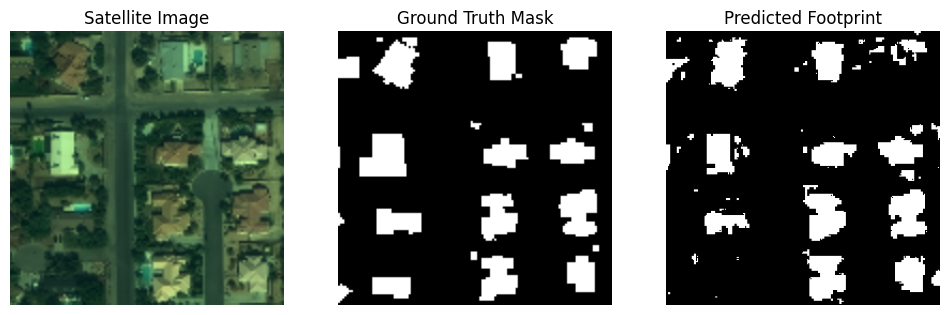

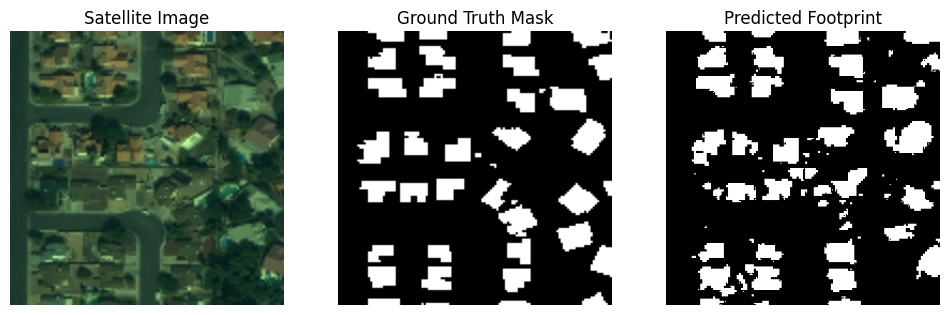

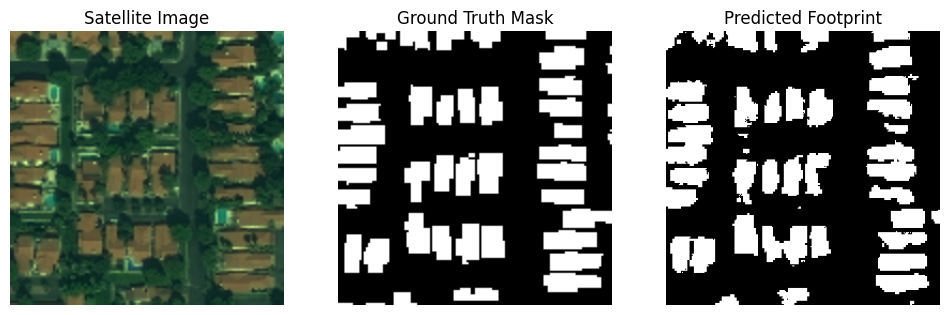

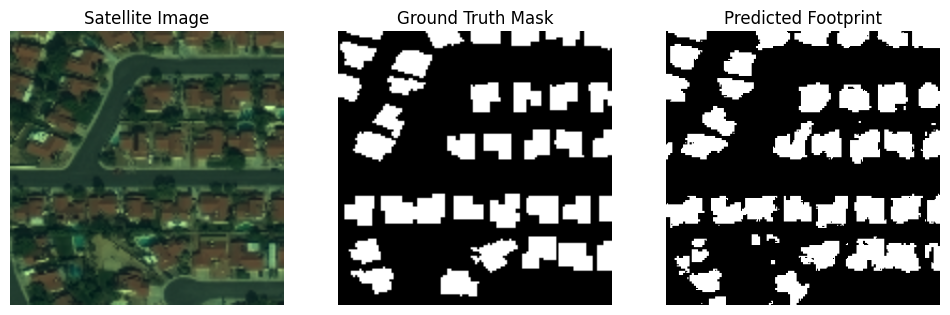

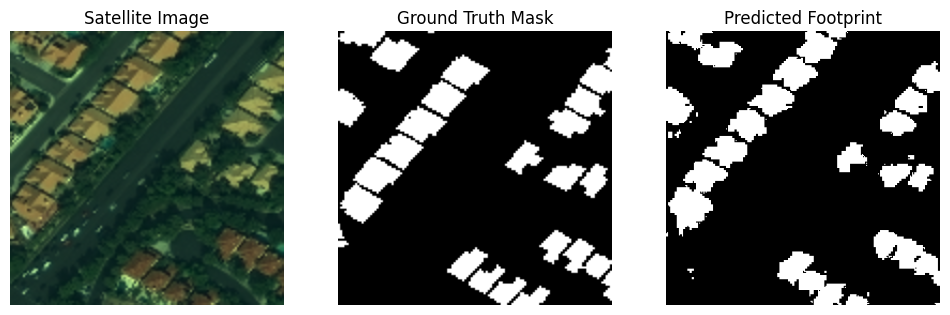

...

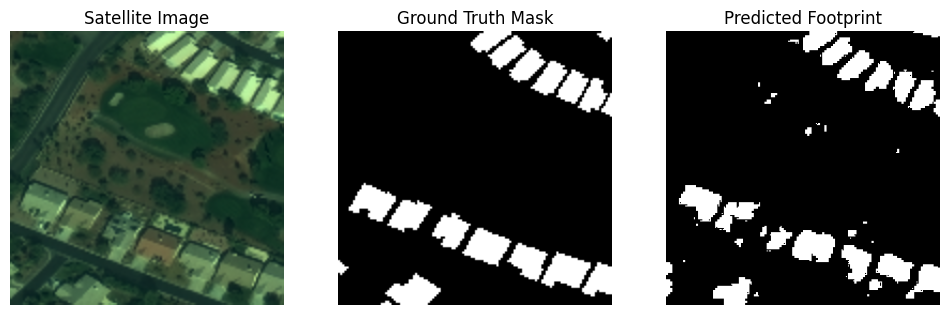

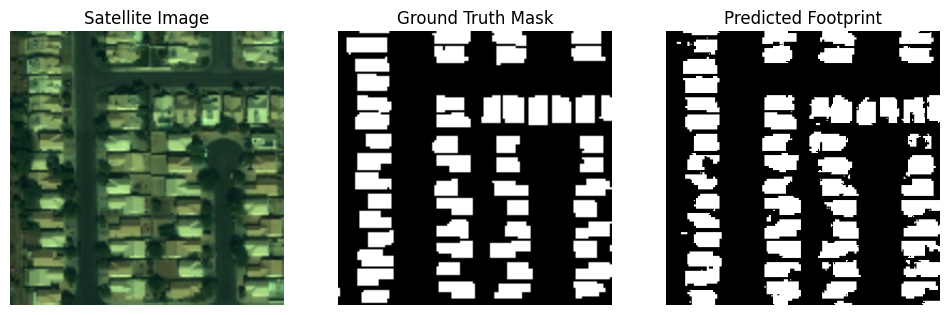

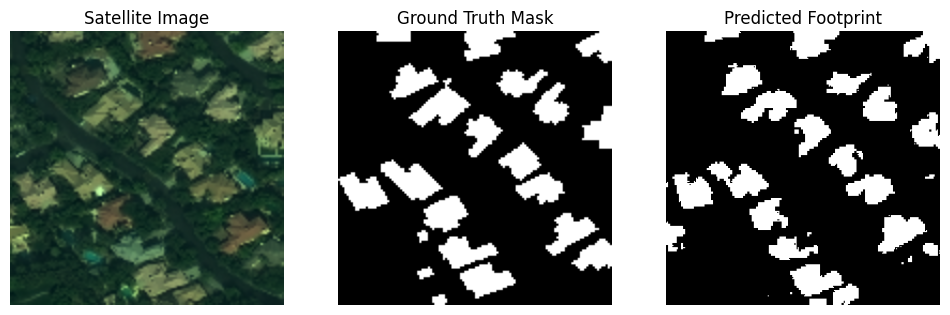

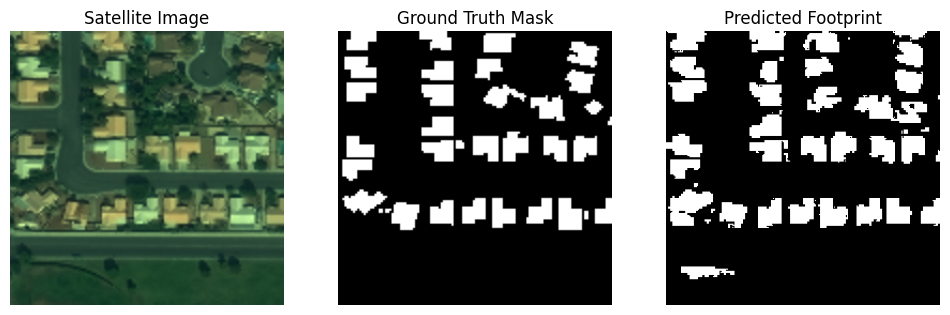

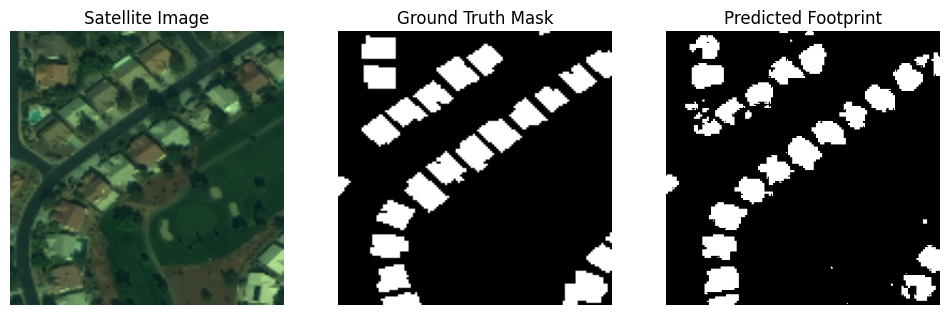

In [29]:
import rasterio
from rasterio.transform import from_bounds

# Define bounds and transform for saving masks
bounds = (0, 0, 256, 256)  # Example bounds
transform = from_bounds(*bounds, 256, 256)

# Save predicted masks as .tif files
for i, pred_mask in enumerate(predicted_masks):
    output_path = f"predicted_footprint_{i}.tif"

    with rasterio.open(
        output_path,
        'w',
        driver='GTiff',
        height=pred_mask.shape[0],
        width=pred_mask.shape[1],
        count=1,
        dtype=rasterio.uint8,
        crs='+proj=latlong',
        transform=transform,
    ) as dst:
        dst.write(pred_mask.squeeze(), 1)


import matplotlib.pyplot as plt

# Display predictions
for i in range(len(X_test)):
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 3, 1)
    plt.title("Satellite Image")
    plt.imshow(X_test[i])
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.title("Ground Truth Mask")
    plt.imshow(rasterio.open(test_mask_paths[i]).read(1), cmap='gray')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.title("Predicted Footprint")
    plt.imshow(predicted_masks[i, :, :, 0], cmap='gray')
    plt.axis('off')

    plt.show()